In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.9 MB/s eta 0:00:00


In [ ]:
cd '/content/drive/MyDrive/Colab Notebooks/ODL'

/content/drive/MyDrive/Colab Notebooks/ODL


# Import Libraries

In [6]:
import os, sys, json, cv2, time, glob, gc, datetime, pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import matplotlib.patches as patches
import seaborn as sns; sns.set(font_scale=1.4)
import keras_tuner as kt
import warnings

from tqdm import tqdm
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import LSTM, Flatten, Dense, Dropout, Lambda
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler, TensorBoard, ModelCheckpoint
from tensorflow.keras.metrics import Precision, Recall, AUC
from tensorflow.keras.regularizers import l1, l2, l1_l2
from sklearn.metrics import roc_curve, auc, confusion_matrix, precision_score, recall_score, roc_auc_score, f1_score, precision_recall_curve, classification_report
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.neural_network import BernoulliRBM
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator
from keras.utils import to_categorical
from kerastuner import HyperModel, Hyperband
from kerastuner.tuners import RandomSearch
from keras.layers import BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image

warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')

<ipython-input-6-a13ab8ef9027>:29: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import HyperModel, Hyperband


# Configurations

In [7]:
CSV_PATH = '/content/drive/MyDrive/df.csv'
ARR_PATH = '/content/drive/MyDrive/natural_scene_data.npz'
SAVE_PATH = '/content/drive/MyDrive/models/RNN/'
CHECKPOINT_DIR = '/content/drive/MyDrive/models/RNN/checkpoints/'

# CSV_PATH = './df.csv'
# ARR_PATH = './natural_scene_data.npz'
# SAVE_PATH = './models/RNN/'
# CHECKPOINT_DIR = './models/RNN/checkpoints/'

EPOCHS = 50
IMAGE_SIZE = (150, 150)
IMG_SIZE = 150
BATCH_SIZE = 32
N_CLASSES = 6

N_TRIALS = 20
N_ROWS = None # Number of rows in the dataset
# TRAIN_LEN = 5000
# VAL_LEN = 1000
# TEST_LEN = 1000
# TRAIN_LEN = 10
# VAL_LEN = 10
# TEST_LEN = 10

# Create a directory if it doesn't exist
if not os.path.exists(SAVE_PATH):
    os.makedirs(SAVE_PATH)
if not os.path.exists(CHECKPOINT_DIR):
    os.makedirs(CHECKPOINT_DIR)

# Check if a GPU is available and set the device
if tf.config.experimental.list_physical_devices('GPU'):
    device = '/GPU:0'
    print("GPU is available")
else:
    device = '/CPU:0'
    print("GPU is not available, using CPU")

GPU is available


# Data Loading

In [8]:
df = pd.read_csv(CSV_PATH)
df.head()

,Image,Label,Label_names,Split
0,[[[0.24313726 0.28235295 0.38039216]\r\n [0.1...,1,street,train
1,[[[0.8117647 0.8117647 0.85882354]\r\n [0.7...,3,buildings,train
2,[[[0.18431373 0.1764706 0.09411765]\r\n [0.3...,1,street,train
3,[[[0.3647059 0.4627451 0.72156864]\r\n [0.3...,0,mountain,val
4,[[[0.2509804 0.3254902 0.21568628]\r\n [0.1...,5,forest,train


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17034 entries, 0 to 17033
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Image        17034 non-null  object
 1   Label        17034 non-null  int64 
 2   Label_names  17034 non-null  object
 3   Split        17034 non-null  object
dtypes: int64(1), object(3)
memory usage: 532.4+ KB


In [9]:
data = np.load(ARR_PATH, allow_pickle=True)
X_train, X_val, Y_train, Y_val, X_test, labels_dict = data['X_train'], data['X_val'], data['Y_train'], data['Y_val'], data['X_test'], data['labels_dict']
print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape, X_test.shape)
labels_dict

(14034, 150, 150, 3) (3000, 150, 150, 3) (14034,) (3000,) (7301, 150, 150, 3)


array({'mountain': 0, 'street': 1, 'glacier': 2, 'buildings': 3, 'sea': 4, 'forest': 5},
      dtype=object)

In [10]:
labels_dict = labels_dict.tolist()
labels_dict = {v: k for k, v in labels_dict.items()}
labels_dict

{0: 'mountain',
 1: 'street',
 2: 'glacier',
 3: 'buildings',
 4: 'sea',
 5: 'forest'}

In [ ]:
if N_ROWS:
    X_train = X_train[:N_ROWS]
    Y_train = Y_train[:N_ROWS]
    X_val = X_val[:N_ROWS]
    Y_val = Y_val[:N_ROWS]
    X_test = X_test[:N_ROWS]
    EPOCHS = 2

In [11]:
# Convert Y_train to one-hot encoded format
Y_train_one_hot = to_categorical(Y_train)
Y_val_one_hot = to_categorical(Y_val)
Y_train_one_hot.shape, Y_val_one_hot.shape

((14034, 6), (3000, 6))

In [ ]:
del Y_train, Y_val, data
gc.collect()
# X_train = X_train[:TRAIN_LEN]
# Y_train_one_hot = Y_train_one_hot[:TRAIN_LEN]
# X_val = X_val[:VAL_LEN]
# Y_val_one_hot = Y_val_one_hot[:VAL_LEN]
# X_test = X_test[:TEST_LEN]

# RNN (with LSTM)

In [47]:
class RNNModel:
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.model = self.build_model()

    def build_model(self):
        model = Sequential()

        # LSTM layer: input shape must be (timesteps, features)
        model.add(LSTM(128, input_shape=input_shape, return_sequences=True))
        model.add(Dropout(0.3))

        # Another LSTM layer
        model.add(LSTM(64, return_sequences=False))
        model.add(Dropout(0.3))

        # Dense layer for classification
        model.add(Dense(128, activation='relu'))
        model.add(Dropout(0.3))

        # Output layer
        model.add(Dense(num_classes, activation='softmax'))

        return model

    def compile_model(self, learning_rate=0.001):
        # Compile the model with Adam optimizer and categorical crossentropy loss
        self.model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                           loss='categorical_crossentropy',
                           metrics=['accuracy',
                                    tf.keras.metrics.Precision(name='precision'),
                                    tf.keras.metrics.Recall(name='recall'),
                                    tf.keras.metrics.AUC(name='auc')])

    def train(self, X_train, Y_train, val_dataset, epochs=50, batch_size=32, checkpoint_dir='checkpoints/'):
        # Callbacks for early stopping, reducing learning rate, and saving checkpoints
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
        checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(checkpoint_dir, 'best_model.keras'),
                                                                 save_best_only=True, monitor='val_loss', mode='min')

        # Train the RNN model with the preprocessed data
        history = self.model.fit(X_train, Y_train,
                                 validation_data=val_dataset,
                                 epochs=epochs,
                                 batch_size=batch_size,
                                 callbacks=[early_stopping, reduce_lr, checkpoint_callback])
        return history

    def get_val_info(self, val_dataset):
        # Unpack the tuple (validation features and labels)
        X_val_rnn, Y_val_one_hot = val_dataset

        # Get true labels and predicted probabilities
        y_true = []
        y_pred_prob = []

        # Collect true labels and predicted probabilities
        y_true.extend(Y_val_one_hot)  # Collect true labels

        # Predict the probabilities for each class using the validation features
        preds = self.model.predict(X_val_rnn)
        y_pred_prob.extend(preds)

        # Convert lists to numpy arrays
        y_true = np.array(y_true)
        y_true = np.argmax(y_true, axis=-1)  # Convert one-hot encoded labels to categorical labels
        y_pred_prob = np.array(y_pred_prob)

        return {
            'y_true': y_true,  # Return true labels
            'y_pred_prob': y_pred_prob  # Return predicted probabilities
        }

    def validation(self, val_dataset):
        results = self.model.evaluate(val_dataset)
        loss, accuracy, precision, recall, auc = results
        print(f'Testing Loss: {loss:.4f}, Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, AUC: {auc:.4f}')
        return {
            'loss': loss,
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'auc': auc
        }

    def predict_batch(self, test_dataset, labels_dict):
        # Predict the output for the test dataset
        predictions = self.model.predict(test_dataset)

        # Get the predicted class (argmax)
        predictions = tf.argmax(predictions, axis=-1)

        # Map predicted indices to actual class labels using labels_dict
        predictions = np.vectorize(labels_dict.get)(predictions)

        return predictions

    def save(self, path):
        # Save the RNN model to the given path
        self.model.save(path)
        print(f'Model saved at {path}')

In [12]:
# Reshape the data for RNN
timesteps = 150  # Could be the number of rows in the image
features = 150 * 3  # Number of features per time step (width * channels)

# Reshape training and validation sets for RNN
X_train_rnn = X_train.reshape(X_train.shape[0], timesteps, features)
X_val_rnn = X_val.reshape(X_val.shape[0], timesteps, features)

# Check shapes
print(X_train_rnn.shape, X_val_rnn.shape)  # Should be (num_samples, timesteps, features)

(14034, 150, 450) (3000, 150, 450)


In [ ]:
# Define input shape and number of classes
input_shape = (150, 450)  # (timesteps, features) for the RNN input
num_classes = 6

# Initialize the RNN model
rnn_model = RNNModel(input_shape=input_shape, num_classes=num_classes)

# Compile the mode
rnn_model.compile_model()

# Print the model summary
rnn_model.model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 150, 128)            │         296,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 150, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 354,950 (1.35 MB)

 Trainable params: 354,950 (1.35 MB)

 Non-trainable params: 0 (0.00 B)

## Training

In [ ]:
# Train the RNN model
history = rnn_model.train(X_train=X_train_rnn,
                          Y_train=Y_train_one_hot,
                          val_dataset=(X_val_rnn, Y_val_one_hot),
                          epochs=EPOCHS,
                          batch_size=BATCH_SIZE,
                          checkpoint_dir='checkpoints/')

Epoch 1/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - accuracy: 0.2870 - auc: 0.6392 - loss: 1.6815 - precision: 0.4601 - recall: 0.0377 - val_accuracy: 0.4820 - val_auc: 0.7983 - val_loss: 1.3719 - val_precision: 0.6165 - val_recall: 0.2937 - learning_rate: 0.0010
Epoch 2/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.4594 - auc: 0.7892 - loss: 1.4014 - precision: 0.6292 - recall: 0.2246 - val_accuracy: 0.4990 - val_auc: 0.8218 - val_loss: 1.2969 - val_precision: 0.6598 - val_recall: 0.3007 - learning_rate: 0.0010
Epoch 3/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.4716 - auc: 0.8114 - loss: 1.3345 - precision: 0.6712 - recall: 0.2460 - val_accuracy: 0.5060 - val_auc: 0.8340 - val_loss: 1.2590 - val_precision: 0.6864 - val_recall: 0.3443 - learning_rate: 0.0010
Epoch 4/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.5259 - auc: 0.8399 - loss: 1.2413 - precision: 0.7008 - recall: 0.3027 - val_accuracy: 0.5380 - val_auc: 0.8492 - val_loss: 1.2072 

In [ ]:
def plot_metrics(history, model, val_dataset, labels_dict=labels_dict):
    # Extract metrics from the history object
    metrics = {
        'loss': history.history.get('loss', []),
        'val_loss': history.history.get('val_loss', []),
        'precision': history.history.get('precision', []),
        'val_precision': history.history.get('val_precision', []),
        'recall': history.history.get('recall', []),
        'val_recall': history.history.get('val_recall', []),
        'auc': history.history.get('auc', []),
        'val_auc': history.history.get('val_auc', []),
        'lr': history.history.get('learning_rate', []),
        'accuracy': history.history.get('accuracy', []),
        'val_accuracy': history.history.get('val_accuracy', [])
    }

    # Calculate F1-score for each epoch (if precision and recall are available)
    metrics['f1_score'] = [2 * ((p * r) / (p + r + 1e-7)) if (p + r) > 0 else 0
                           for p, r in zip(metrics['precision'], metrics['recall'])]
    metrics['val_f1_score'] = [2 * ((p * r) / (p + r + 1e-7)) if (p + r) > 0 else 0
                               for p, r in zip(metrics['val_precision'], metrics['val_recall'])]

    epochs = range(1, len(metrics['loss']) + 1)

    plt.figure(figsize=(33, 22))

    # Plot Loss
    plt.subplot(3, 3, 1)
    plt.plot(metrics['loss'], label='Train Loss')
    plt.plot(metrics['val_loss'], label='Val Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Accuracy
    plt.subplot(3, 3, 2)
    plt.plot(metrics['accuracy'], label='Train Accuracy')
    plt.plot(metrics['val_accuracy'], label='Val Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Precision
    plt.subplot(3, 3, 3)
    plt.plot(metrics['precision'], label='Train Precision')
    plt.plot(metrics['val_precision'], label='Val Precision')
    plt.title('Model Precision')
    plt.ylabel('Precision')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Recall
    plt.subplot(3, 3, 4)
    plt.plot(metrics['recall'], label='Train Recall')
    plt.plot(metrics['val_recall'], label='Val Recall')
    plt.title('Model Recall')
    plt.ylabel('Recall')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot F1-score
    plt.subplot(3, 3, 5)
    plt.plot(metrics['f1_score'], label='Train F1-Score')
    plt.plot(metrics['val_f1_score'], label='Val F1-Score')
    plt.title('Model F1-Score')
    plt.ylabel('F1-Score')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot AUC
    plt.subplot(3, 3, 6)
    plt.plot(metrics['auc'], label='Train AUC')
    plt.plot(metrics['val_auc'], label='Val AUC')
    plt.title('Model AUC')
    plt.ylabel('AUC')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot learning rate
    plt.subplot(3, 3, 7)
    plt.plot(metrics['lr'], label='Learning Rate')
    plt.title('Learning Rate')
    plt.ylabel('Learning Rate')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    result = model.get_val_info(val_dataset)
    y_true, y_pred_prob = result['y_true'], result['y_pred_prob']

    # ROC Curve for each class
    num_classes = y_pred_prob.shape[1]
    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true == i, y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    plt.subplot(3, 3, 8)
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} {labels_dict[i]} (area = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title('ROC Curve for Each Class')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Precision-Recall Curve for each class
    plt.subplot(3, 3, 9)
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true == i, y_pred_prob[:, i])
        plt.plot(recall, precision, label=f'Class {i} {labels_dict[i]}')
    plt.title('Precision-Recall Curve for Each Class')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


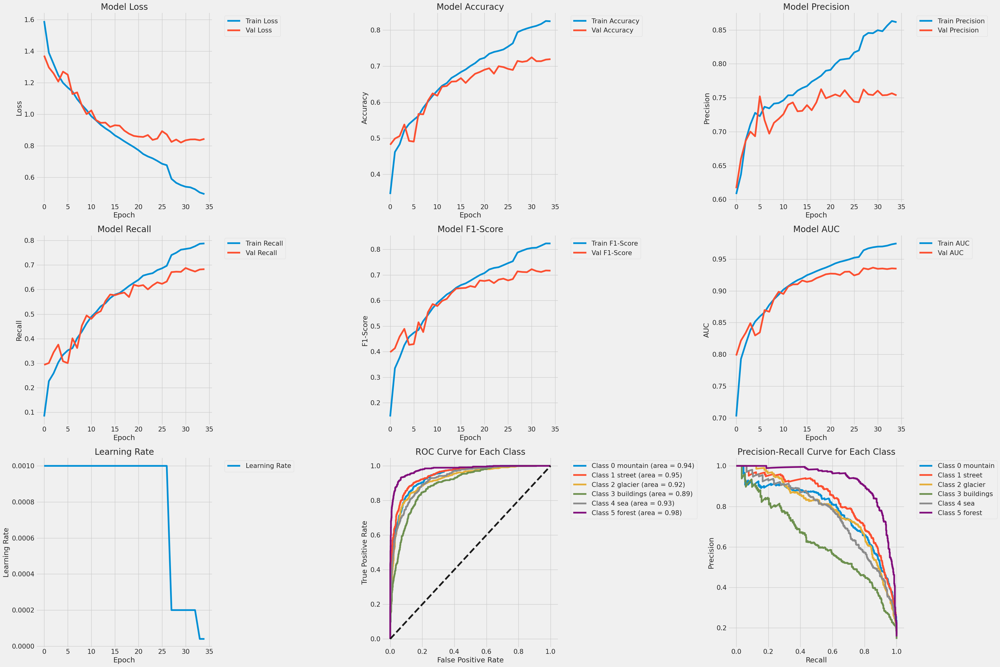

In [ ]:
plot_metrics(history, model=rnn_model, val_dataset=(X_val_rnn, Y_val_one_hot), labels_dict=labels_dict)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Confusion Matrix:
[[376   3  72  21  42  11]
 [  8 391   7  67   9  19]
 [ 65  17 393  28  45   5]
 [ 40  84  27 234  33  19]
 [ 34  12  58  44 340  22]
 [  8  37   2  12   7 408]]


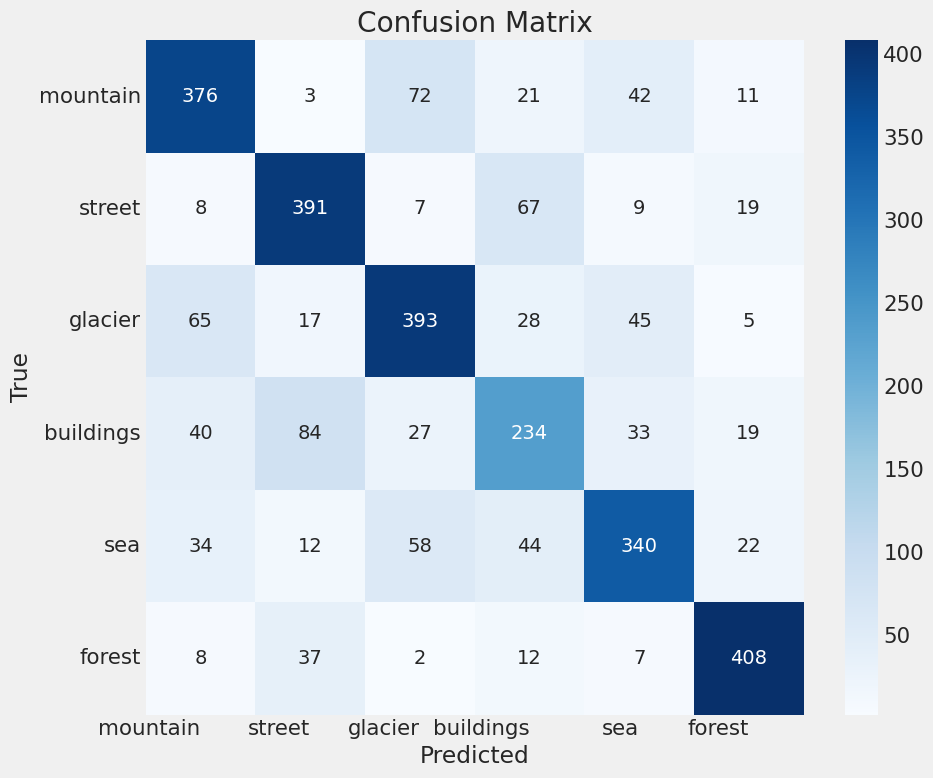

Classification Report:
              precision    recall  f1-score   support

    mountain       0.71      0.72      0.71       525
      street       0.72      0.78      0.75       501
     glacier       0.70      0.71      0.71       553
   buildings       0.58      0.54      0.56       437
         sea       0.71      0.67      0.69       510
      forest       0.84      0.86      0.85       474

    accuracy                           0.71      3000
   macro avg       0.71      0.71      0.71      3000
weighted avg       0.71      0.71      0.71      3000



In [ ]:
# Get validation information
result = rnn_model.get_val_info((X_val_rnn, Y_val_one_hot))
y_true, y_pred_prob = result['y_true'], result['y_pred_prob']
y_pred = np.argmax(y_pred_prob, axis=1)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))  # Increase the figure size
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels_dict.values(), yticklabels=labels_dict.values(), annot_kws={"size": 14})  # Increase annotation font size
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.xticks(ha='right')  # Rotate x-axis labels for better readability
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Print the classification report
class_report = classification_report(y_true, y_pred, target_names=labels_dict.values())
print("Classification Report:")
print(class_report)

## Testing

In [ ]:
# Reshape the test dataset for RNN input (if not already done)
X_test_rnn = X_test.reshape(X_test.shape[0], timesteps, features)  # (num_samples, timesteps, features)

# Predict using the RNN model
result = rnn_model.model.predict(X_test_rnn)

# Convert the predictions to class labels
predicted_labels = np.vectorize(labels_dict.get)(tf.argmax(result, axis=-1))

# Print unique labels and their counts
unique_labels, counts = np.unique(predicted_labels, return_counts=True)
for label, count in zip(unique_labels, counts):
    print(f"{label}: {count}")


229/229 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
buildings: 1062
forest: 1156
glacier: 1304
mountain: 1252
sea: 1202
street: 1325


## Save result

In [ ]:
# Save the entire model
rnn_model.save(SAVE_PATH + 'rnn_model.keras')

Model saved at /content/drive/MyDrive/models/DBN/rnn_model.keras


In [ ]:
# Save training history
with open(SAVE_PATH + 'training_history_1.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:
# Load model
loaded_model = load_model(SAVE_PATH + 'rnn_model.keras')
loaded_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 150, 128)            │         296,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 150, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,064,852 (4.06 MB)

 Trainable params: 354,950 (1.35 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 709,902 (2.71 MB)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


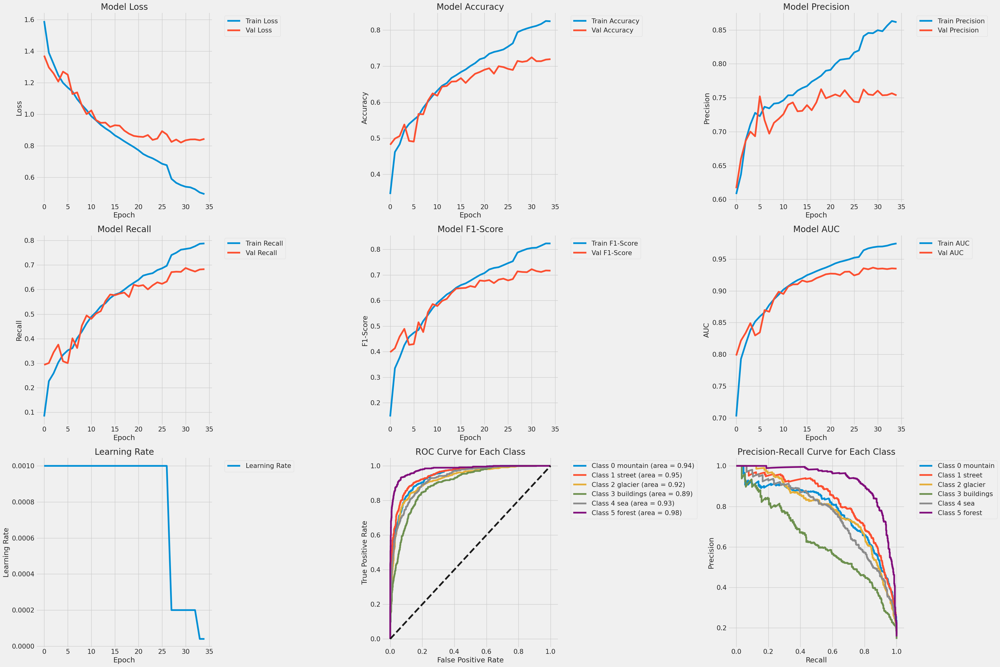

In [ ]:
# Open training history
with open(SAVE_PATH + 'training_history_1.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

model = RNNModel(input_shape=input_shape, num_classes=num_classes)
model.model = loaded_model
model.compile_model()
# Train the model for zero epochs to get an empty history object
empty_history = model.train(X_train=X_train_rnn, Y_train=Y_train_one_hot, val_dataset=(X_val_rnn, Y_val_one_hot), epochs=0)

# Set the loaded history to the empty history object
empty_history.history = loaded_history

# Now empty_history contains the loaded history
plot_metrics(empty_history, model=model, val_dataset=(X_val_rnn, Y_val_one_hot))

## Hyperparameter tuning

In [20]:
import logging
logging.basicConfig(level=logging.DEBUG)
logger = logging.getLogger(__name__)

class RNNHyperModel(kt.HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        # Define the hyperparameter search space
        rnn_units_1 = hp.Int('rnn_units_1', min_value=64, max_value=256, step=64)
        rnn_units_2 = hp.Int('rnn_units_2', min_value=64, max_value=256, step=64)
        dense_units = hp.Int('dense_units', min_value=128, max_value=512, step=128)
        dropout_1 = hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1)
        dropout_2 = hp.Float('dropout_2', min_value=0.2, max_value=0.5, step=0.1)
        dense_dropout = hp.Float('dense_dropout', min_value=0.2, max_value=0.5, step=0.1)
        learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')

        # Build the model using hyperparameters
        model = tf.keras.Sequential()
        model.add(LSTM(rnn_units_1, input_shape=self.input_shape, return_sequences=True))
        model.add(Dropout(dropout_1))
        model.add(LSTM(rnn_units_2, return_sequences=False))
        model.add(Dropout(dropout_2))
        model.add(Dense(dense_units, activation='relu'))
        model.add(Dropout(dense_dropout))
        model.add(Dense(self.num_classes, activation='softmax'))

        # Compile the model
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                      loss='categorical_crossentropy',
                      metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), tf.keras.metrics.AUC()])

        return model

    def get_val_info(self, val_dataset):
        # Get true labels and predicted probabilities
        y_true = []
        y_pred_prob = []

        # Iterate through validation dataset and collect true labels and predicted probabilities
        for batch in val_dataset:
            x_val, y_val = batch  # x_val: validation features, y_val: validation true labels
            y_true.extend(y_val.numpy())  # Collect true labels

            # Predict the probabilities for each class
            preds = self.model.predict(x_val)
            y_pred_prob.extend(preds)

        # Convert lists to numpy arrays
        y_true = np.array(y_true)
        y_true = np.argmax(y_true, axis=-1)  # Convert one-hot encoded labels to categorical labels
        y_pred_prob = np.array(y_pred_prob)

        return {
            'y_true': y_true,  # Return true labels
            'y_pred_prob': y_pred_prob  # Return predicted probabilities
        }

# Hyperparameter tuning with Hyperband
tuner = kt.Hyperband(
    RNNHyperModel(input_shape=(150, 450), num_classes=6),
    objective='val_accuracy',
    max_epochs=50,
    factor=3,
    project_name='rnn_tuning',
    overwrite=True
)

# Display search space summary
tuner.search_space_summary()

Search space summary
Default search space size: 7
rnn_units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 64, 'max_value': 256, 'step': 64, 'sampling': 'linear'}
rnn_units_2 (Int)
{'default': None, 'conditions': [], 'min_value': 64, 'max_value': 256, 'step': 64, 'sampling': 'linear'}
dense_units (Int)
{'default': None, 'conditions': [], 'min_value': 128, 'max_value': 512, 'step': 128, 'sampling': 'linear'}
dropout_1 (Float)
{'default': 0.2, 'conditions': [], 'min_value': 0.2, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
dropout_2 (Float)
{'default': 0.2, 'conditions': [], 'min_value': 0.2, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
dense_dropout (Float)
{'default': 0.2, 'conditions': [], 'min_value': 0.2, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
learning_rate (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}


In [12]:
Y_train_one_hot = Y_train_one_hot.astype('float32')
Y_val_one_hot = Y_val_one_hot.astype('float32')

In [ ]:
import numpy as np

# Check for NaN values in the datasets
print(np.isnan(X_train_rnn).sum(), np.isnan(Y_train_one_hot).sum())
print(np.isnan(X_val_rnn).sum(), np.isnan(Y_val_one_hot).sum())

0 0
0 0


In [ ]:
print(f"X_train_rnn shape: {X_train_rnn.shape}, dtype: {X_train_rnn.dtype}")
print(f"Y_train_one_hot shape: {Y_train_one_hot.shape}, dtype: {Y_train_one_hot.dtype}")
print(f"X_val_rnn shape: {X_val_rnn.shape}, dtype: {X_val_rnn.dtype}")
print(f"Y_val_one_hot shape: {Y_val_one_hot.shape}, dtype: {Y_val_one_hot.dtype}")

X_train_rnn shape: (14034, 150, 450), dtype: float32
Y_train_one_hot shape: (14034, 6), dtype: float32
X_val_rnn shape: (3000, 150, 450), dtype: float32
Y_val_one_hot shape: (3000, 6), dtype: float32


In [13]:
val_dataset=(X_val_rnn, Y_val_one_hot)

In [21]:
# Callbacks for early stopping and reducing learning rate
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
checkpoint_callback = ModelCheckpoint(filepath=os.path.join(CHECKPOINT_DIR, 'best_rnn_model.keras'),
                                      save_weights_only=False,
                                      monitor='val_loss',
                                      save_best_only=True,
                                      mode='min')
log_dir = os.path.join('logs', 'BestRNN', 'fit', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

class ValidationLoggerCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        val_acc = logs.get('val_accuracy')
        val_loss = logs.get('val_loss')
        print(f"Epoch {epoch+1}: val_accuracy = {val_acc}, val_loss = {val_loss}")

validation_logger = ValidationLoggerCallback()

# Search for the best hyperparameters
tuner.search(x=X_train_rnn,
             y=Y_train_one_hot,
             validation_data=val_dataset,
             epochs=50,
             batch_size=BATCH_SIZE,
             callbacks=[early_stopping, reduce_lr, checkpoint_callback, tensorboard_callback, validation_logger],
             verbose = 1)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Display the best hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=N_TRIALS)[0]
print(best_hyperparameters.values)

Trial 90 Complete [00h 07m 42s]
val_accuracy: 0.7193333506584167

Best val_accuracy So Far: 0.734666645526886
Total elapsed time: 02h 25m 42s
{'rnn_units_1': 192, 'rnn_units_2': 256, 'dense_units': 256, 'dropout_1': 0.30000000000000004, 'dropout_2': 0.4, 'dense_dropout': 0.30000000000000004, 'learning_rate': 0.002849590134019719, 'tuner/epochs': 50, 'tuner/initial_epoch': 17, 'tuner/bracket': 3, 'tuner/round': 3, 'tuner/trial_id': '0047'}


## Hypermodel Training

In [22]:
# Train the model with the best hyperparameters
history_best = best_model.fit(
    x=X_train_rnn,
    y=Y_train_one_hot,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[early_stopping, reduce_lr, checkpoint_callback, tensorboard_callback]
    )

Epoch 1/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - accuracy: 0.7729 - auc: 0.9571 - loss: 0.6508 - precision: 0.8266 - recall: 0.7103 - val_accuracy: 0.7147 - val_auc: 0.9296 - val_loss: 0.8541 - val_precision: 0.7882 - val_recall: 0.6277 - learning_rate: 0.0028
Epoch 2/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.7694 - auc: 0.9583 - loss: 0.6375 - precision: 0.8346 - recall: 0.7052 - val_accuracy: 0.7110 - val_auc: 0.9297 - val_loss: 0.8495 - val_precision: 0.7906 - val_recall: 0.6230 - learning_rate: 0.0028
Epoch 3/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.7718 - auc: 0.9585 - loss: 0.6360 - precision: 0.8356 - recall: 0.7044 - val_accuracy: 0.6947 - val_auc: 0.9215 - val_loss: 0.9267 - val_precision: 0.7527 - val_recall: 0.6320 - learning_rate: 0.0028
Epoch 4/50
439/439 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.7846 - auc: 0.9599 - loss: 0.6244 - precision: 0.8409 - recall: 0.7249 - val_accuracy: 0.7040 - val_auc: 0.9274 - val_loss: 0.86

In [23]:
def plot_metrics(history):
    # Extract metrics from the history object
    metrics = {
        'loss': history.history.get('loss', []),
        'val_loss': history.history.get('val_loss', []),
        'precision': history.history.get('precision', []),
        'val_precision': history.history.get('val_precision', []),
        'recall': history.history.get('recall', []),
        'val_recall': history.history.get('val_recall', []),
        'auc': history.history.get('auc', []),
        'val_auc': history.history.get('val_auc', []),
        'lr': history.history.get('learning_rate', []),
        'accuracy': history.history.get('accuracy', []),
        'val_accuracy': history.history.get('val_accuracy', []),
    }

    # Calculate F1-score for each epoch (if precision and recall are available)
    metrics['f1_score'] = [2 * ((p * r) / (p + r + 1e-7)) if (p + r) > 0 else 0
                           for p, r in zip(metrics['precision'], metrics['recall'])]
    metrics['val_f1_score'] = [2 * ((p * r) / (p + r + 1e-7)) if (p + r) > 0 else 0
                               for p, r in zip(metrics['val_precision'], metrics['val_recall'])]

    epochs = range(1, len(metrics['loss']) + 1)

    plt.figure(figsize=(33, 22))

    # Plot Loss
    plt.subplot(3, 3, 1)
    plt.plot(metrics['loss'], label='Train Loss')
    plt.plot(metrics['val_loss'], label='Val Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Accuracy
    plt.subplot(3, 3, 2)
    plt.plot(metrics['accuracy'], label='Train Accuracy')
    plt.plot(metrics['val_accuracy'], label='Val Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Precision
    plt.subplot(3, 3, 3)
    plt.plot(metrics['precision'], label='Train Precision')
    plt.plot(metrics['val_precision'], label='Val Precision')
    plt.title('Model Precision')
    plt.ylabel('Precision')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Recall
    plt.subplot(3, 3, 4)
    plt.plot(metrics['recall'], label='Train Recall')
    plt.plot(metrics['val_recall'], label='Val Recall')
    plt.title('Model Recall')
    plt.ylabel('Recall')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot F1-score
    plt.subplot(3, 3, 5)
    plt.plot(metrics['f1_score'], label='Train F1-Score')
    plt.plot(metrics['val_f1_score'], label='Val F1-Score')
    plt.title('Model F1-Score')
    plt.ylabel('F1-Score')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot AUC
    plt.subplot(3, 3, 6)
    plt.plot(metrics['auc'], label='Train AUC')
    plt.plot(metrics['val_auc'], label='Val AUC')
    plt.title('Model AUC')
    plt.ylabel('AUC')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot learning rate
    plt.subplot(3, 3, 7)
    plt.plot(metrics['lr'], label='Learning Rate')
    plt.title('Learning Rate')
    plt.ylabel('Learning Rate')
    plt.xlabel('Epoch')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

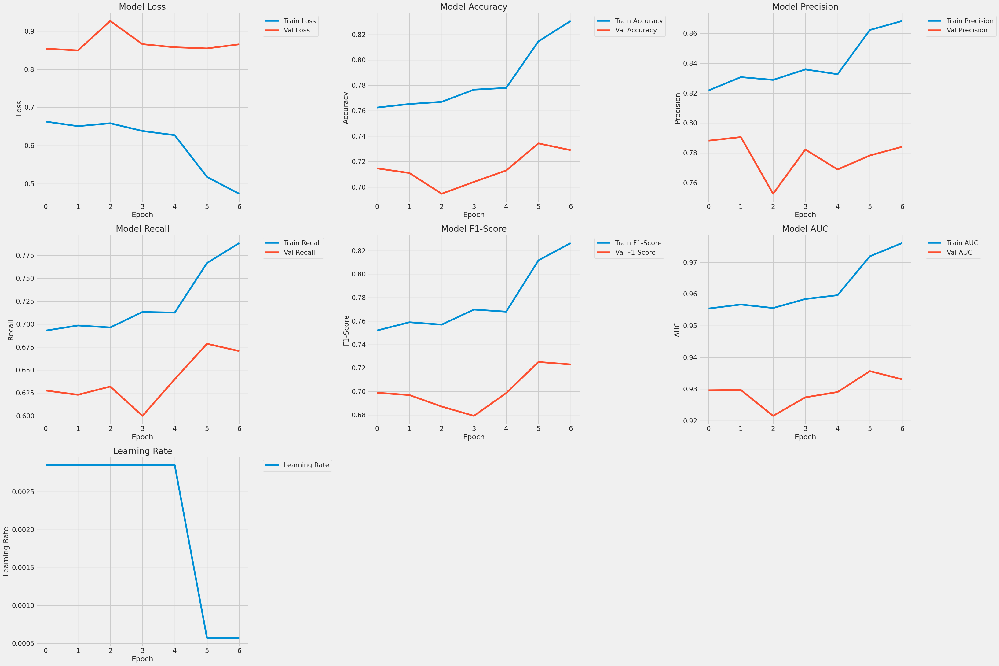

In [24]:
plot_metrics(history_best)

In [25]:
# Evaluate the best model
result = best_model.evaluate(
    x=X_val_rnn,
    y=Y_val_one_hot,
    batch_size=BATCH_SIZE,
    verbose=2
    )
loss, accuracy, precision, recall, auc = result
print(f'Validation Loss: {loss:.4f}, Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, AUC: {auc:.4f}')

94/94 - 1s - 12ms/step - accuracy: 0.7110 - auc: 0.9297 - loss: 0.8495 - precision: 0.7906 - recall: 0.6230
Validation Loss: 0.8495, Accuracy: 0.7110, Precision: 0.7906, Recall: 0.6230, AUC: 0.9297


94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Confusion Matrix:
[[391   6  50  29  37  12]
 [  4 411   5  37  19  25]
 [ 63  30 380  25  43  12]
 [ 27  97  19 231  31  32]
 [ 55  17  52  42 321  23]
 [  4  52   0  10   9 399]]


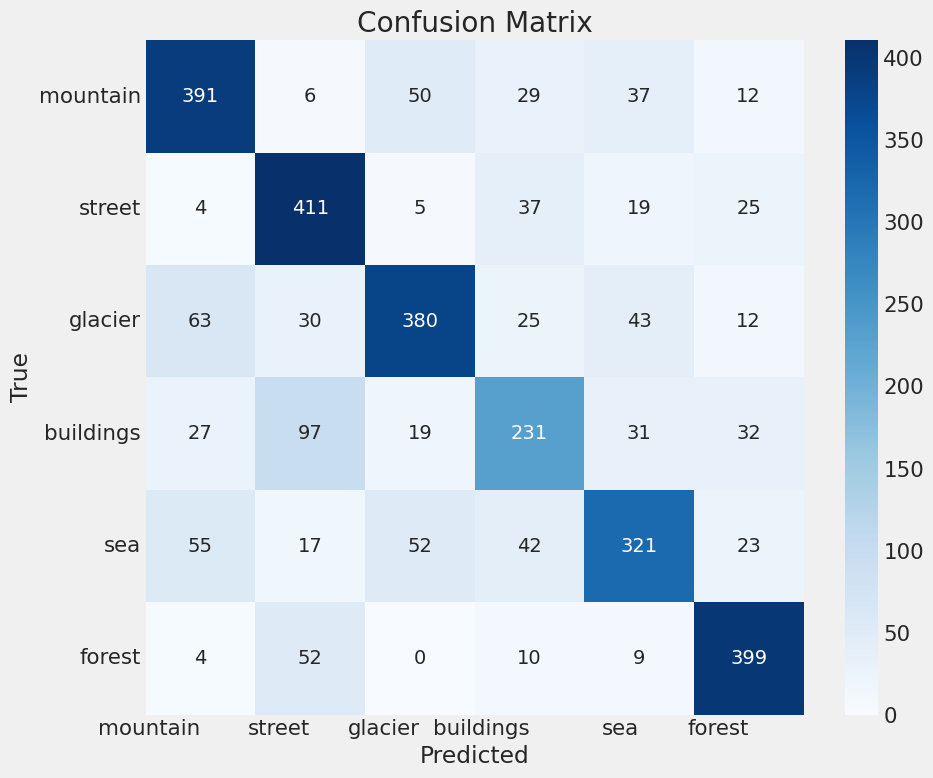

Classification Report:
              precision    recall  f1-score   support

    mountain       0.72      0.74      0.73       525
      street       0.67      0.82      0.74       501
     glacier       0.75      0.69      0.72       553
   buildings       0.62      0.53      0.57       437
         sea       0.70      0.63      0.66       510
      forest       0.79      0.84      0.82       474

    accuracy                           0.71      3000
   macro avg       0.71      0.71      0.71      3000
weighted avg       0.71      0.71      0.71      3000



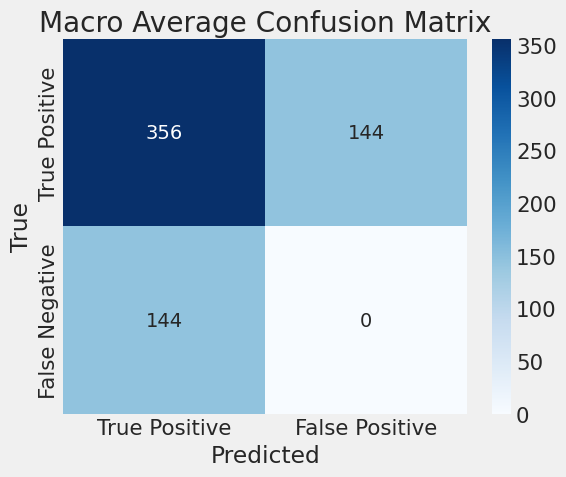

Classification Report:
              precision    recall  f1-score   support

    mountain       0.72      0.74      0.73       525
      street       0.67      0.82      0.74       501
     glacier       0.75      0.69      0.72       553
   buildings       0.62      0.53      0.57       437
         sea       0.70      0.63      0.66       510
      forest       0.79      0.84      0.82       474

    accuracy                           0.71      3000
   macro avg       0.71      0.71      0.71      3000
weighted avg       0.71      0.71      0.71      3000



In [39]:
def get_conf_matrix(model=best_model, val_dataset=val_dataset, labels_dict=labels_dict):
    # Unpack the validation data
    X_val_rnn, Y_val_one_hot = val_dataset

    # Convert true labels from one-hot encoding to categorical labels
    y_true = np.argmax(Y_val_one_hot, axis=-1)

    # Predict the probabilities for each class
    y_pred_prob = model.predict(X_val_rnn)

    # Get the predicted class by taking the argmax of the probabilities
    y_pred = np.argmax(y_pred_prob, axis=1)

    # Print the confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:")
    print(conf_matrix)

    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))  # Increase the figure size
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels_dict.values(), yticklabels=labels_dict.values(), annot_kws={"size": 14})  # Increase annotation font size
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.xticks(ha='right')  # Rotate x-axis labels for better readability
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    # Print the classification report
    class_report = classification_report(y_true, y_pred, target_names=labels_dict.values())
    print("Classification Report:")
    print(class_report)

    # Extract true positives (TP) and false positives (FP) for each class
    TP = np.diag(conf_matrix)
    FP = conf_matrix.sum(axis=0) - TP
    FN = conf_matrix.sum(axis=1) - TP

    # Compute the macro average of TP and FP
    macro_TP = np.mean(TP)
    macro_FP = np.mean(FP)
    macro_FN = np.mean(FN)

    # Create a confusion matrix for the macro average
    macro_conf_matrix = np.array([[macro_TP, macro_FP], [macro_FN, 0]])

    # Plot the confusion matrix for the macro average
    plt.figure(figsize=(6, 5))
    sns.heatmap(macro_conf_matrix, annot=True, fmt='.0f', cmap='Blues', xticklabels=['True Positive', 'False Positive'], yticklabels=['True Positive', 'False Negative'], annot_kws={"size": 14})
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Macro Average Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Print the classification report
    class_report = classification_report(y_true, y_pred, target_names=labels_dict.values())
    print("Classification Report:")
    print(class_report)

get_conf_matrix(model=best_model, val_dataset=val_dataset, labels_dict=labels_dict)

## Hypermodel Testing

In [41]:
X_test_rnn = X_test.reshape(X_test.shape[0], timesteps, features)

result = best_model.predict(X_test_rnn)
result = np.argmax(result, axis=1)
result = [labels_dict[x] for x in result]
for i in np.unique(result, return_counts=True):
    print(i)

229/229 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
[ 983 1262 1172 1321 1102 1461]


## Save best RNN result

In [42]:
# Save the dictionary to a file
with open(SAVE_PATH + 'best_hyperparameters.pkl', 'wb') as file:
    pickle.dump(best_hyperparameters.values, file)

In [43]:
# Save the entire model
best_model.save(SAVE_PATH + 'best_rnn_model.keras')

In [44]:
# Save the training history
with open(SAVE_PATH + 'training_history_best.pkl', 'wb') as file:
    pickle.dump(history_best.history, file)

In [45]:
# Load the hyper model
loaded_best_model = load_model(SAVE_PATH + 'best_rnn_model.keras')
loaded_best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 150, 192)            │         493,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 150, 192)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 256)                 │         459,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │           1,542 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,062,804 (11.68 MB)

 Trainable params: 1,020,934 (3.89 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,041,870 (7.79 MB)

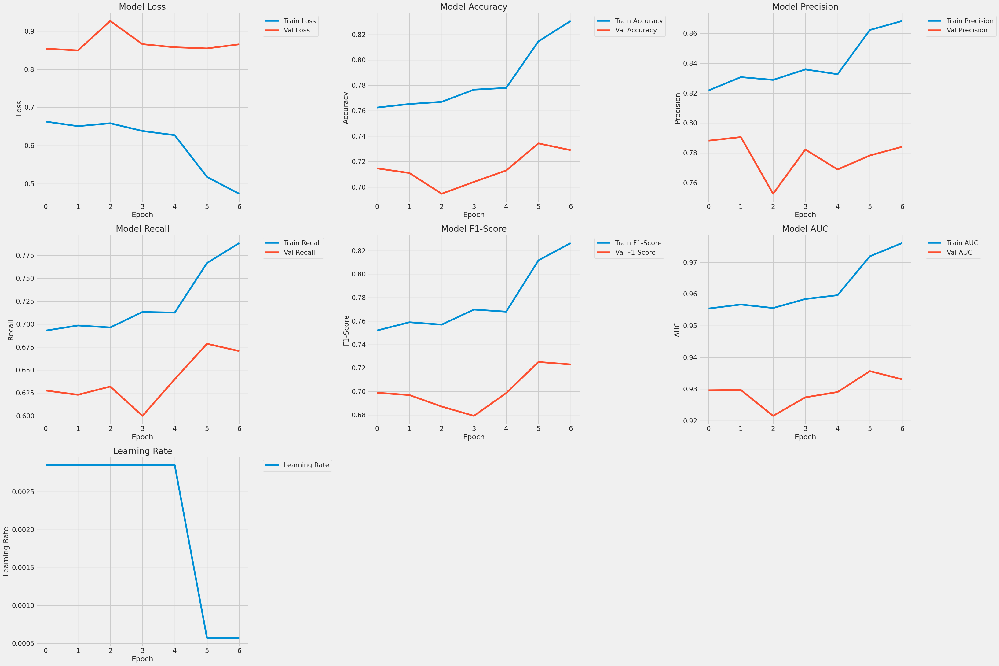

In [51]:
# Load the training history
with open(SAVE_PATH + 'training_history_best.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

input_shape = (150, 450)
num_classes = 6

model = RNNModel(input_shape=input_shape, num_classes=num_classes)
model.model = loaded_best_model
model.compile_model()

# Create an empty history object
empty_history = model.train(X_train=X_train_rnn, Y_train=Y_train_one_hot, val_dataset=(X_val_rnn, Y_val_one_hot), epochs=0)

# Set the loaded history to the empty history object
empty_history.history = loaded_history

# Now empty_history contains the loaded history
plot_metrics(empty_history)

# Error analysis

In [58]:
data = np.load(ARR_PATH, allow_pickle=True)
X_train, X_val, Y_train, Y_val, X_test, labels_dict = data['X_train'], data['X_val'], data['Y_train'], data['Y_val'], data['X_test'], data['labels_dict']
print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape, X_test.shape)
labels_dict = labels_dict.tolist()
labels_dict = {v: k for k, v in labels_dict.items()}
labels_dict

(14034, 150, 150, 3) (3000, 150, 150, 3) (14034,) (3000,) (7301, 150, 150, 3)


{0: 'mountain',
 1: 'street',
 2: 'glacier',
 3: 'buildings',
 4: 'sea',
 5: 'forest'}

In [52]:
# Load the dictionary from the file
with open(SAVE_PATH + 'best_hyperparameters.pkl', 'rb') as file:
    loaded_hyperparameters = pickle.load(file)

print(loaded_hyperparameters)

{'rnn_units_1': 192, 'rnn_units_2': 256, 'dense_units': 256, 'dropout_1': 0.30000000000000004, 'dropout_2': 0.4, 'dense_dropout': 0.30000000000000004, 'learning_rate': 0.002849590134019719, 'tuner/epochs': 50, 'tuner/initial_epoch': 17, 'tuner/bracket': 3, 'tuner/round': 3, 'tuner/trial_id': '0047'}


In [53]:
loaded_model = load_model(SAVE_PATH + 'best_rnn_model.keras')
loaded_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 150, 192)            │         493,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 150, 192)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 256)                 │         459,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │           1,542 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,062,804 (11.68 MB)

 Trainable params: 1,020,934 (3.89 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,041,870 (7.79 MB)

In [54]:
result = loaded_model.predict(X_val_rnn)
result = np.argmax(result, axis=1)
result

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


array([0, 5, 2, ..., 3, 1, 3])

In [59]:
ans = [labels_dict[x] for x in Y_val]
for i in np.unique(ans, return_counts=True):
    print(i)

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
[437 474 553 525 510 501]


In [60]:
result2 = [labels_dict[x] for x in result]
for i in np.unique(result2, return_counts=True):
    print(i)

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
[374 503 506 544 460 613]


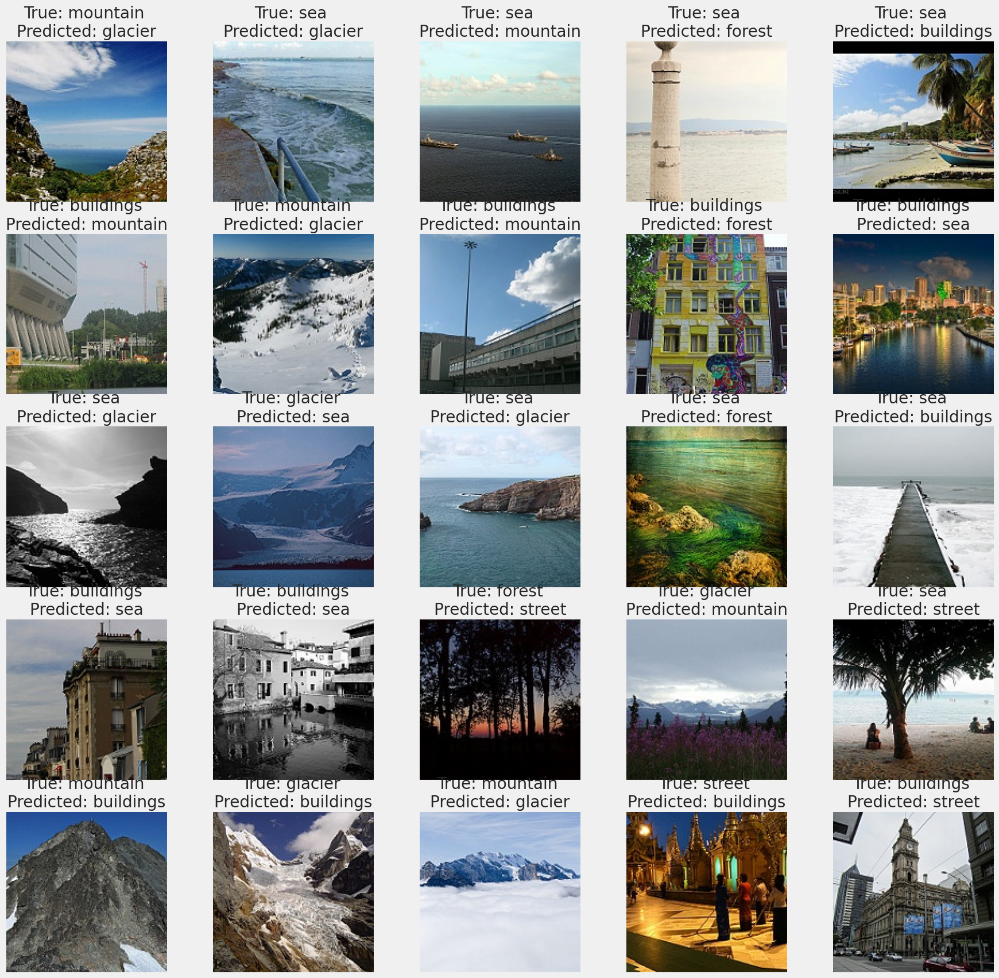

In [61]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels, num=25):
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]

    plt.figure(figsize=(20, 20))
    for i in range(len(mislabeled_indices[0])):
        if i >= num:
            break
        plt.subplot(5, 5, i + 1)
        plt.imshow(mislabeled_images[i])
        plt.title(f'True: {class_names[test_labels[mislabeled_indices][i]]} \nPredicted: {class_names[mislabeled_labels[i]]}')
        plt.axis('off')

print_mislabeled_images(labels_dict, X_val, Y_val, result) # maximum printing out 25 images


Confusion Matrix:
[[391   6  50  29  37  12]
 [  4 411   5  37  19  25]
 [ 63  30 380  25  43  12]
 [ 27  97  19 231  31  32]
 [ 55  17  52  42 321  23]
 [  4  52   0  10   9 399]]


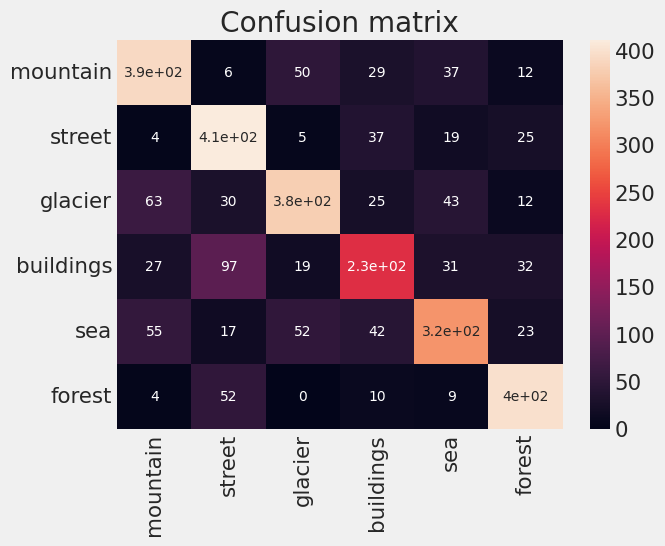

In [62]:
CM = confusion_matrix(Y_val, result)
print("Confusion Matrix:")
print(CM)
ax = plt.axes()
sns.heatmap(CM, annot=True,
           annot_kws={"size": 10},
           xticklabels=labels_dict.values(),
           yticklabels=labels_dict.values(), ax = ax)
ax.set_title('Confusion matrix')
plt.show()

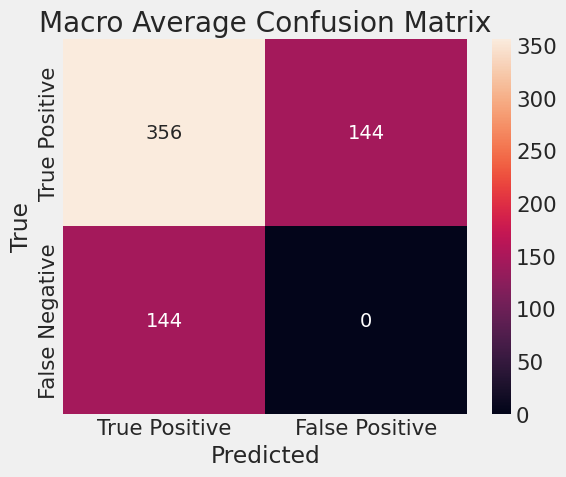

Classification Report:
              precision    recall  f1-score   support

    mountain       0.72      0.74      0.73       525
      street       0.67      0.82      0.74       501
     glacier       0.75      0.69      0.72       553
   buildings       0.62      0.53      0.57       437
         sea       0.70      0.63      0.66       510
      forest       0.79      0.84      0.82       474

    accuracy                           0.71      3000
   macro avg       0.71      0.71      0.71      3000
weighted avg       0.71      0.71      0.71      3000



In [63]:
# Extract true positives (TP) and false positives (FP) for each class
TP = np.diag(CM)
FP = CM.sum(axis=0) - TP
FN = CM.sum(axis=1) - TP

# Compute the macro average of TP and FP
macro_TP = np.mean(TP)
macro_FP = np.mean(FP)
macro_FN = np.mean(FN)

# Create a confusion matrix for the macro average
macro_CM = np.array([[macro_TP, macro_FP], [macro_FN, 0]])

# Plot the confusion matrix for the macro average
plt.figure(figsize=(6, 5))
sns.heatmap(macro_CM, annot=True, fmt='.0f', xticklabels=['True Positive', 'False Positive'], yticklabels=['True Positive', 'False Negative'], annot_kws={"size": 14})
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Macro Average Confusion Matrix')
plt.tight_layout()
plt.show()

# Print the classification report
class_report = classification_report(Y_val, result, target_names=labels_dict.values())
print("Classification Report:")
print(class_report)

# Model Explainability

In [13]:
loaded_best_model = load_model(SAVE_PATH + 'best_rnn_model.keras')
# Print the model summary to identify the penultimate layer
loaded_best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 150, 192)            │         493,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 150, 192)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 256)                 │         459,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │           1,542 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,062,804 (11.68 MB)

 Trainable params: 1,020,934 (3.89 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,041,870 (7.79 MB)

In [14]:
X_val_rnn.shape

(3000, 150, 450)

## t-SNE (t-Distributed Stochastic Neighbor Embedding)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
{0: 'mountain', 1: 'street', 2: 'glacier', 3: 'buildings', 4: 'sea', 5: 'forest'}


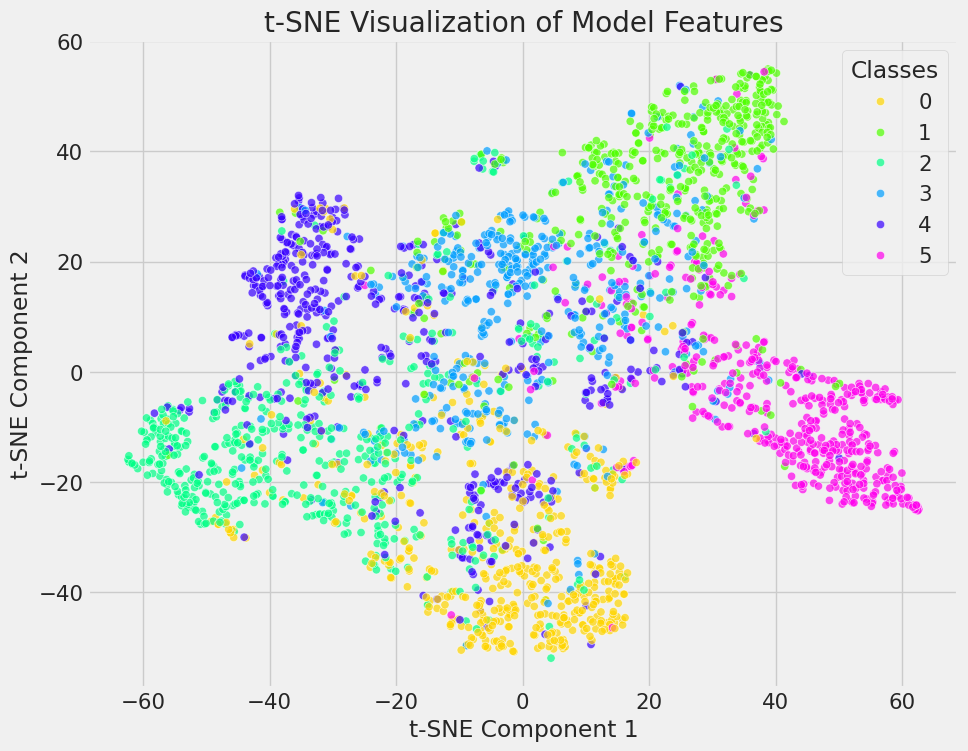

In [99]:
from sklearn.manifold import TSNE
from tensorflow.keras.models import Model

# Extract the penultimate layer
penultimate_layer_model = Model(inputs=loaded_best_model.inputs,
                                outputs=loaded_best_model.layers[-2].output)

# Extract features from the validation data
features = penultimate_layer_model.predict(X_val_rnn)

# Apply t-SNE on the extracted features
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(features)

# Print data label for better reference
print(labels_dict)

# Create a DataFrame for easier plotting
df = pd.DataFrame(tsne_results, columns=['Component 1', 'Component 2'])
df['Label'] = np.argmax(Y_val_one_hot, axis=1)  # Convert one-hot to label

# Plot t-SNE results
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Component 1', y='Component 2', hue='Label',
                palette=sns.color_palette("hsv", len(np.unique(df['Label']))), legend="full", alpha=0.7, data=df)
plt.title('t-SNE Visualization of Model Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Classes')
plt.show()

## Saliency Maps

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


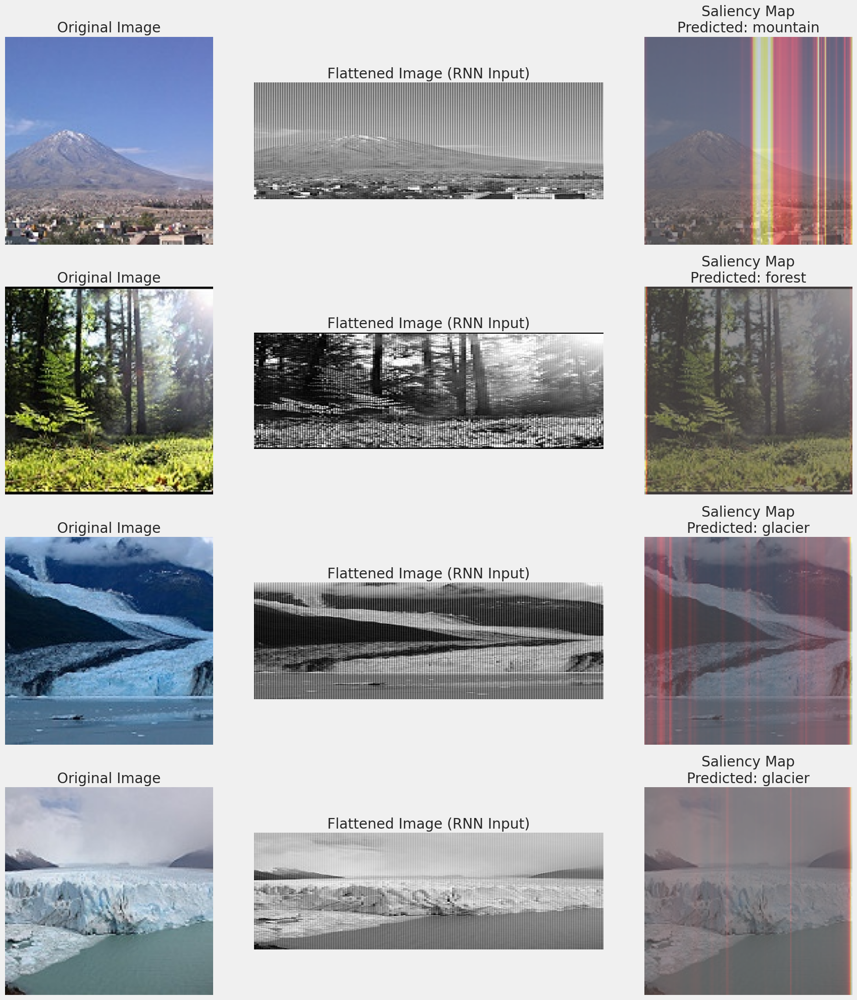

In [26]:
from skimage.transform import resize

def compute_saliency_map(img_array, model):
    # Flattened image input for the RNN model
    img_array = tf.convert_to_tensor(img_array, dtype=tf.float32)
    img_array = tf.expand_dims(img_array, axis=0)

    with tf.GradientTape() as tape:
        tape.watch(img_array)
        predictions = model(img_array)
        top_pred_index = tf.argmax(predictions[0], axis=-1)
        class_channel = predictions[:, top_pred_index]

    grads = tape.gradient(class_channel, img_array)
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)

    # Convert the saliency map to NumPy
    saliency = saliency.numpy()

    return saliency

def plot_saliency_for_images(model, X_val, X_val_rnn, labels_dict, nrows=4, alpha=0.4):
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(20, 5 * nrows),
                            subplot_kw={'xticks': [], 'yticks': []})

    for i in range(nrows):
        img = X_val[i]  # The original image with shape (150, 150, 3)
        img_rnn = X_val_rnn[i]  # The reshaped image for the RNN model with shape (150, 450)

        # Compute Saliency Map
        saliency_map = compute_saliency_map(img_rnn, model)

        # Make predictions using the flattened image for the RNN
        predictions = model.predict(tf.expand_dims(img_rnn, axis=0))
        predicted_class = np.argmax(predictions)

        # Resize the saliency map to the original image size (150, 150)
        saliency_map_resized = resize(saliency_map, (150, 150))

        # Plot Original Image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')

        # Plot Flattened Image
        axes[i, 1].imshow(img_rnn.reshape(150, 450), cmap='gray')
        axes[i, 1].set_title('Flattened Image (RNN Input)')
        axes[i, 1].axis('off')

        # Plot Saliency Map (overlaid on the original image)
        axes[i, 2].imshow(img, alpha=1 - alpha)
        axes[i, 2].imshow(saliency_map_resized, cmap='hot', alpha=alpha)
        axes[i, 2].set_title(f'Saliency Map\nPredicted: {labels_dict[predicted_class]}')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

plot_saliency_for_images(model=loaded_best_model, X_val=X_val, X_val_rnn=X_val_rnn, labels_dict=labels_dict)

## LIME (Local Interpretable Model-agnostic Explanations)

In [27]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=83e29796d4399f25e79bcba73d306edb5dbb9a726c6a1f12442c7a0e9c196a95
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

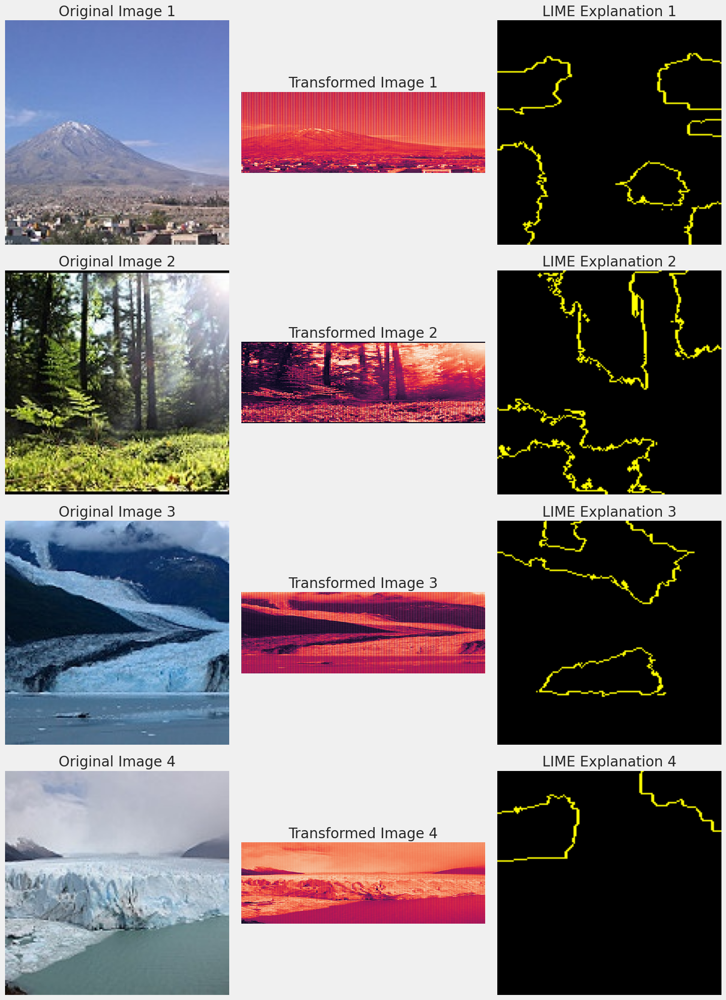

In [31]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Create a function to predict the class probabilities based on the flattened image
def predict_fn(images):
    # Flatten and reshape the images to match the RNN input shape (150, 450)
    flattened_images = images.reshape((images.shape[0], -1))
    reshaped_images = flattened_images.reshape((-1, 150, 450))
    return loaded_best_model.predict(reshaped_images)

# Create the LIME explainer
explainer = lime_image.LimeImageExplainer()

# Function to plot LIME explanations for images
def plot_lime_for_images(model, X_val, X_val_rnn, labels_dict, nrows=4):
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 5 * nrows),
                             subplot_kw={'xticks': [], 'yticks': []})

    for i in range(nrows):
        # Original image
        img = X_val[i]
        img_rnn = X_val_rnn[i]

        # Explain the prediction for the image using LIME
        explanation = explainer.explain_instance(img.astype('double'), predict_fn, top_labels=1, hide_color=0, num_samples=1000)

        # Get the explanation for the top predicted class
        top_pred_index = explanation.top_labels[0]
        temp, mask = explanation.get_image_and_mask(top_pred_index, positive_only=True, num_features=10, hide_rest=False)

        # Ensure the image is scaled to [0, 1]
        temp = temp / 255.0

        # Plot Original Image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f'Original Image {i+1}')
        axes[i, 0].axis('off')

        # Plot Transformed Image
        axes[i, 1].imshow(img_rnn)
        axes[i, 1].set_title(f'Transformed Image {i+1}')
        axes[i, 1].axis('off')

        # Plot LIME Explanation
        axes[i, 2].imshow(mark_boundaries(temp, mask))
        axes[i, 2].set_title(f'LIME Explanation {i+1}')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

plot_lime_for_images(model=loaded_best_model, X_val=X_val, X_val_rnn=X_val_rnn, labels_dict=labels_dict)

# Other Image Testing

In [ ]:
import os, sys, json, cv2, time, glob, gc, datetime, pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import matplotlib.patches as patches
import seaborn as sns; sns.set(font_scale=1.4)
import keras_tuner as kt
import warnings

from tqdm import tqdm
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Reshape, BatchNormalization, Activation, MaxPool2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler, TensorBoard, ModelCheckpoint
from tensorflow.keras.metrics import Precision, Recall, AUC
from tensorflow.keras.regularizers import l1, l2, l1_l2
from sklearn.metrics import roc_curve, auc, confusion_matrix, precision_score, recall_score, roc_auc_score, f1_score, precision_recall_curve, classification_report
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from kerastuner import HyperModel, Hyperband
from kerastuner.tuners import RandomSearch
from keras.layers import BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image

warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')

/var/folders/nv/cddx4y_s46n_4yhxp7v2bb540000gn/T/ipykernel_62279/70600251.py:23: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import HyperModel, Hyperband


In [32]:
# Define a function to apply random transformations to images
def random_transform(image, label):
    image = tf.image.random_flip_left_right(image)  # Randomly flip the image horizontally
    image = tf.image.random_flip_up_down(image)  # Randomly flip the image vertically
    image = tf.image.random_brightness(image, max_delta=0.1)  # Randomly change the brightness
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)  # Randomly change the contrast
    image = tf.image.random_saturation(image, lower=0.9, upper=1.1)  # Randomly change the saturation
    image = tf.image.random_hue(image, max_delta=0.1)  # Randomly change the hue
    image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))  # Randomly rotate the image
    image = tf.image.random_crop(image, size=[150, 150, 3])  # Randomly crop the image

    # Random zoom
    scales = list(np.arange(0.8, 1.0, 0.1))
    boxes = np.zeros((len(scales), 4))
    for i, scale in enumerate(scales):
        x1 = y1 = 0.5 - 0.5 * scale
        x2 = y2 = 0.5 + 0.5 * scale
        boxes[i] = [x1, y1, x2, y2]

    def random_zoom(image):
        crops = tf.image.crop_and_resize([image], boxes=boxes, box_indices=np.zeros(len(scales)), crop_size=(150, 150))
        return crops[tf.random.uniform(shape=[], minval=0, maxval=len(scales), dtype=tf.int32)]

    image = random_zoom(image)

    # Random Gaussian noise
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=0.1, dtype=tf.float32)
    image = tf.add(image, noise)

    return image, label

# Function to cast images and labels to float16
def cast_to_float16(image, label):
    image = tf.cast(image, tf.float16)
    label = tf.cast(label, tf.float16)
    return image, label

def create_dataset(X, Y, batch_size=32):
    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    # dataset = dataset.shuffle(buffer_size=len(X))
    dataset = dataset.map(random_transform, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.map(cast_to_float16, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [33]:
data = np.load('/content/drive/MyDrive/natural_scene_data.npz', allow_pickle=True)
labels_dict = data['labels_dict']
labels_dict = labels_dict.tolist()
labels_dict = {v: k for k, v in labels_dict.items()}
labels_dict

{0: 'mountain',
 1: 'street',
 2: 'glacier',
 3: 'buildings',
 4: 'sea',
 5: 'forest'}

In [34]:
img_path = '/content/drive/MyDrive/apu.png'
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (150, 150))

# Append the image and its corresponding label to the lists
image = image / 255.0 # Normalize the pixel values, data scaling
image.shape

(150, 150, 3)

In [35]:
loaded_model = load_model(SAVE_PATH + 'best_rnn_model.keras')

In [36]:
image_transformed = np.array(random_transform(image, 0)[0].numpy())
image_transformed = tf.cast(image_transformed, tf.float16).numpy()
image_transformed = np.expand_dims(image_transformed, axis=0)
image_transformed.shape

(1, 150, 150, 3)

In [37]:
reshaped_image = image_transformed.reshape(1, 150, 150 * 3)

In [40]:
result = loaded_model.predict(reshaped_image)
result_class = np.argmax(result, axis=1)
print(result_class)
result_class = labels_dict[result_class[0]]
result_class

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[3]


'buildings'

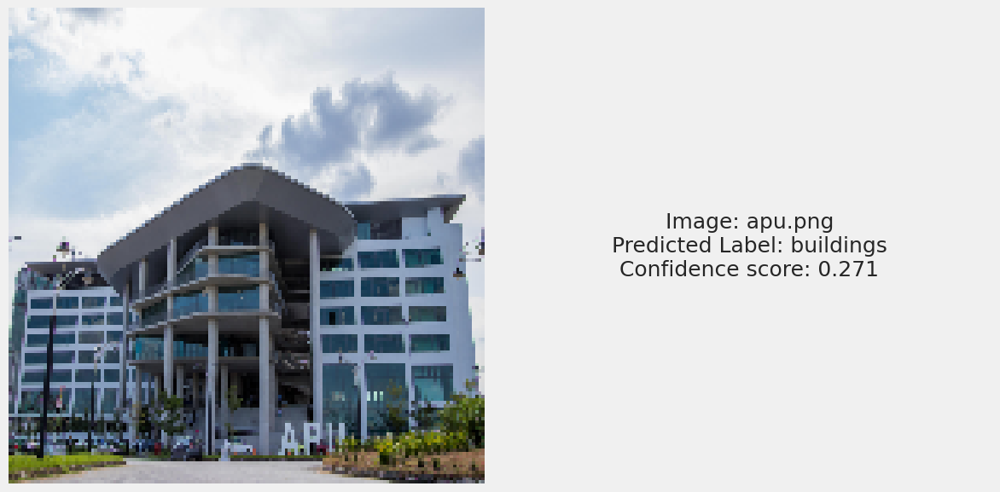

In [41]:
# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Display the image in the left subplot
ax1.imshow(image)
ax1.axis('off')  # Turn off the axis for the image

# Add the text annotation in the right subplot
textstr = f'''
Image: {img_path.split('/')[-1]}
Predicted Label: {result_class}
Confidence score: {np.max(result):.3f}
'''
ax2.text(0.5, 0.5, textstr, fontsize=18, va='center', ha='center')
ax2.axis('off')  # Turn off the axis for the text

# Adjust layout
plt.tight_layout()
plt.show()

In [51]:
img_path2 = '/content/drive/MyDrive/forest.png'
image2 = cv2.imread(img_path2)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = cv2.resize(image2, (150, 150))

# Append the image and its corresponding label to the lists
image2 = image2 / 255.0 # Normalize the pixel values, data scaling
image2.shape

(150, 150, 3)

In [52]:
image_transformed2 = np.array(random_transform(image2, 0)[0].numpy())
image_transformed2 = tf.cast(image_transformed2, tf.float16).numpy()
image_transformed2 = np.expand_dims(image_transformed2, axis=0)
image_transformed2.shape

(1, 150, 150, 3)

In [53]:
reshaped_image2 = image_transformed2.reshape(1, 150, 150 * 3)

In [54]:
result2 = loaded_model.predict(reshaped_image2)
result_class2 = np.argmax(result2, axis=1)
print(result_class2)
result_class2 = labels_dict[result_class2[0]]
result_class2

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[5]


'forest'

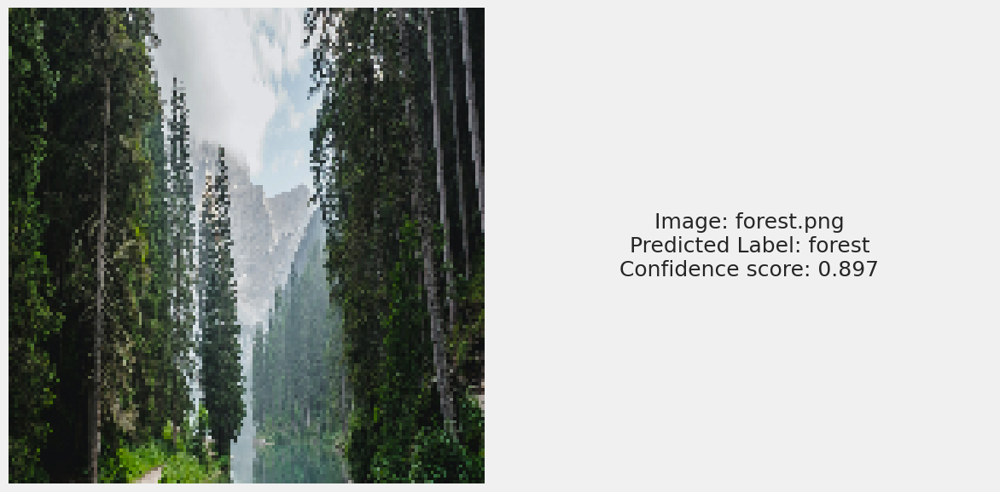

In [55]:
# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Display the image in the left subplot
ax1.imshow(image2)
ax1.axis('off')  # Turn off the axis for the image

# Add the text annotation in the right subplot
textstr = f'''
Image: {img_path2.split('/')[-1]}
Predicted Label: {result_class2}
Confidence score: {np.max(result2):.3f}
'''
ax2.text(0.5, 0.5, textstr, fontsize=18, va='center', ha='center')
ax2.axis('off')  # Turn off the axis for the text

# Adjust layout
plt.tight_layout()
plt.show()